# Homework-10/7/2017: Backpropagation
In this project, I will use backpropagation to complish an xor problem. There are two inputs, two hidden units and one output neuron in this structure. The activation function is $f(x)=1/(1+\exp(-x))$. The learning rate is 0.6 in each layer. Please use BP networks to train the network and make the error less than $0.008$. Record the number of iteration steps. Analysis the data result and write a report.
![](neural_network.png)


## Basic method
This part will use the basic cost function-quadratic cost function, basic activation function-sigmoid function and basic initial method of weights-according to the Gaussian distribution. 
Later on, I will use other methods for comparison and analysis.

### Import modules

In [1]:
import numpy as np
import matplotlib.pyplot as plt

### Prepare the data

In [2]:
# List all possibilities of XOR problem.
training_data = np.array([[0,0], [0,1], [1,0], [1,1]])
desired_output = np.array([0, 1, 1, 0])

### Build the network

In [22]:
class Network(object):
    
    def __init__(self, sizes):
        """The list "sizes" contains the number of neurons in respective layers.""" 
        self.sizes = sizes
        self.number_layers = len(sizes)
        self.biases = [np.random.randn(i, 1) for i in sizes[1:]]
        self.weights = [np.random.randn(i, j) for i,j in zip(sizes[1:],sizes[:-1])]   
        
    def feedforward(self, input_):
        """Return the output of the neural network."""
        activation = input_
        for bias, weight in zip(self.biases, self.weights):
            output = np.dot(weight, activation) + bias
            activation = sigmoid(output)
        return activation
    
    def set_values(self, weights, biases):
        self.weights = weights
        self.biases = biases
    
    def backprop(self, training_data, desired_output, lr_rate):
        """Update parameters"""
        # Store gradients of weights and biases for update
        grad_weights = np.zeros_like(self.weights)
        grad_biases = np.zeros_like(self.biases)
        
        # Store outputs and activations for backprop
        outputs = []
        activation = training_data
        activations = [activation] 
        for b, w in zip(self.biases, self.weights):
            output = np.dot(w, activation) + b
            outputs.append(output)
            activation = sigmoid(output)
            activations.append(activation)
        
        # Compute the gradients of the last layer
        error = self.feedforward(training_data) - desired_output
        delta = error * sigmoid_deriv(outputs[-1])
        grad_biases[-1] = delta
        grad_weights[-1] = np.dot(delta, activations[-2].transpose())
        
        # Compute gradients of remaining layers
        for layer in range(2, self.number_layers):
            delta = np.dot(self.weights[-layer+1].transpose(), delta) * sigmoid_deriv(outputs[-layer])
            grad_biases[-layer] = delta
            grad_weights[-layer] = np.dot(delta, activations[-layer-1].transpose())
        
        # Update weights and biases
        self.weights = [w-lr_rate*grad_w for w, grad_w in zip(self.weights, grad_weights)]
        self.biases = [b-lr_rate*grad_b for b, grad_b in zip(self.biases, grad_biases)]
        

In [3]:
# Activation Function
def sigmoid(a):
    """Sigmoid function"""
    return 1 / (1 + np.exp(-a))

def sigmoid_deriv(a):
    """Derivative of the sigmoid function"""
    return sigmoid(a) * (1 - sigmoid(a))


### Set hyperparameters            


In [28]:
# Set training epoches and learning rate
epochs = 50000
lr_rate = 0.6

### Train the network

In [81]:
# Train the network 
def train(training_data, desired_output, epochs, lr_rate):
    losses = [] # Store losses for plotting
    epoch_n = [] # Store epochs for plotting
    network = Network([2,2,1])
    for epoch in range(epochs):
        for x, y in zip(training_data, desired_output):
            x = x[:, None] # Convert row vector to column vector
            network.backprop(x, y, lr_rate)
            # Printing out the training progress
            train_loss = abs(y - network.feedforward(x))
            if epoch % 500 == 0:
                losses.append(train_loss[0][0]) 
                epoch_n.append(epoch)
            print("Epoch: {}, Training Loss: {:.5f}".format(epoch, train_loss[0][0]))
    return network.weights, network.biases, losses, epoch_n
    
weights, biases, train_losses, epoch_n = train(training_data, desired_output, epochs, lr_rate)

Epoch: 0, Training Loss: 0.64046
Epoch: 0, Training Loss: 0.24261
Epoch: 0, Training Loss: 0.40488
Epoch: 0, Training Loss: 0.65505
Epoch: 1, Training Loss: 0.61554
Epoch: 1, Training Loss: 0.26549
Epoch: 1, Training Loss: 0.42676
Epoch: 1, Training Loss: 0.62918
Epoch: 2, Training Loss: 0.59302
Epoch: 2, Training Loss: 0.28656
Epoch: 2, Training Loss: 0.44629
Epoch: 2, Training Loss: 0.60614
Epoch: 3, Training Loss: 0.57315
Epoch: 3, Training Loss: 0.30546
Epoch: 3, Training Loss: 0.46342
Epoch: 3, Training Loss: 0.58603
Epoch: 4, Training Loss: 0.55591
Epoch: 4, Training Loss: 0.32204
Epoch: 4, Training Loss: 0.47820
Epoch: 4, Training Loss: 0.56872
Epoch: 5, Training Loss: 0.54116
Epoch: 5, Training Loss: 0.33634
Epoch: 5, Training Loss: 0.49084
Epoch: 5, Training Loss: 0.55397
Epoch: 6, Training Loss: 0.52865
Epoch: 6, Training Loss: 0.34852
Epoch: 6, Training Loss: 0.50157
Epoch: 6, Training Loss: 0.54149
Epoch: 7, Training Loss: 0.51810
Epoch: 7, Training Loss: 0.35879
Epoch: 7, 

### Evaluate the network

In [32]:
def eval_network(input_value):
    """Test the network and return the output value."""   
    network = Network([2,2,1])
    network.set_values(weights, biases)
    output_value = network.feedforward(input_value)
    return output_value[0][0]
    
def test():
    """A few tests to make sure the network performs properly."""
    print("0 XOR 0 = 0?: ", eval_network(np.array([0,0])[:,None]))
    print("0 XOR 1 = 1?: ", eval_network(np.array([0,1])[:,None]))
    print("1 XOR 0 = 1?: ", eval_network(np.array([1,0])[:,None]))
    print("1 XOR 1 = 0?: ", eval_network(np.array([1,1])[:,None]))   
    
test()    

0 XOR 0 = 0?:  0.00706920635592
0 XOR 1 = 1?:  0.993918426743
1 XOR 0 = 1?:  0.993910528596
1 XOR 1 = 0?:  0.00636980548488


### Analysis the results

Let us plot the training losses of all the epoches below.

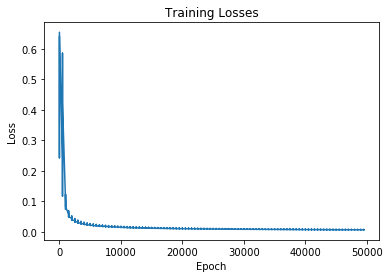

In [83]:
plt.figure(1)
train_losses = np.array(train_losses)
plt.plot(epoch_n, train_losses)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Losses")
plt.show()

We can see that as the model is training, the loss is fluctuating and getting smaller and smaller.

## Other methods
### Weight Initializaion
This part will use different ways for weights initialization: Uniform initialization method.

In [33]:
class Network2(object):
    
    def __init__(self, sizes):
        """The list "sizes" contains the number of neurons in respective layers.""" 
        self.sizes = sizes
        self.number_layers = len(sizes)
        self.biases = [np.random.rand(i, 1) for i in sizes[1:]] 
        self.weights = [np.random.rand(i, j) / j for i,j in zip(sizes[1:],sizes[:-1])] # Modify this line to normal distribution
        
    def feedforward(self, input_):
        """Return the output of the neural network."""
        activation = input_
        for bias, weight in zip(self.biases, self.weights):
            output = np.dot(weight, activation) + bias
            activation = sigmoid(output)
        return activation
    
    def set_values(self, weights, biases):
        self.weights = weights
        self.biases = biases
    
    def backprop(self, training_data, desired_output, lr_rate):
        """Update parameters"""
        # Store gradients of weights and biases for update
        grad_weights = np.zeros_like(self.weights)
        grad_biases = np.zeros_like(self.biases)
        
        # Store outputs and activations for backprop
        outputs = []
        activation = training_data
        activations = [activation] 
        for b, w in zip(self.biases, self.weights):
            output = np.dot(w, activation) + b
            outputs.append(output)
            activation = sigmoid(output)
            activations.append(activation)
        
        # Compute the gradients of the last layer
        error = self.feedforward(training_data) - desired_output
        delta = error * sigmoid_deriv(outputs[-1])
        grad_biases[-1] = delta
        grad_weights[-1] = np.dot(delta, activations[-2].transpose())
        
        # Compute gradients of remaining layers
        for layer in range(2, self.number_layers):
            delta = np.dot(self.weights[-layer+1].transpose(), delta) * sigmoid_deriv(outputs[-layer])
            grad_biases[-layer] = delta
            grad_weights[-layer] = np.dot(delta, activations[-layer-1].transpose())
        
        # Update weights and biases
        self.weights = [w-lr_rate*grad_w for w, grad_w in zip(self.weights, grad_weights)]
        self.biases = [b-lr_rate*grad_b for b, grad_b in zip(self.biases, grad_biases)]
        

In [36]:
# Set training epoches and learning rate
epochs2 = 46000
lr_rate = 0.6

In [85]:
# Train the network with the weight initialization of uniform distribution.
def train2(training_data, desired_output, epochs2, lr_rate):
    losses = [] # Store losses for plotting
    epoch_n = [] # Store epochs for plotting
    network = Network2([2,2,1]) # Modify this line
    for epoch in range(epochs2):
        for x, y in zip(training_data, desired_output):
            x = x[:, None] # Convert row vector to column vector
            network.backprop(x, y, lr_rate)
            # Printing out the training progress
            train_loss = abs(y - network.feedforward(x))
            if epoch % 500 == 0:
                losses.append(train_loss[0][0]) 
                epoch_n.append(epoch)
            print("Epoch: {}, Training Loss: {:.5f}".format(epoch, train_loss[0][0]))
    return network.weights, network.biases, losses, epoch_n
    
weights2, biases2, train_losses2, epoch_n2 = train2(training_data, desired_output, epochs2, lr_rate)

Epoch: 0, Training Loss: 0.74461
Epoch: 0, Training Loss: 0.23633
Epoch: 0, Training Loss: 0.22796
Epoch: 0, Training Loss: 0.74753
Epoch: 1, Training Loss: 0.70226
Epoch: 1, Training Loss: 0.27628
Epoch: 1, Training Loss: 0.26366
Epoch: 1, Training Loss: 0.70507
Epoch: 2, Training Loss: 0.66001
Epoch: 2, Training Loss: 0.31599
Epoch: 2, Training Loss: 0.29866
Epoch: 2, Training Loss: 0.66433
Epoch: 3, Training Loss: 0.62107
Epoch: 3, Training Loss: 0.35260
Epoch: 3, Training Loss: 0.33068
Epoch: 3, Training Loss: 0.62804
Epoch: 4, Training Loss: 0.58759
Epoch: 4, Training Loss: 0.38425
Epoch: 4, Training Loss: 0.35832
Epoch: 4, Training Loss: 0.59755
Epoch: 5, Training Loss: 0.56023
Epoch: 5, Training Loss: 0.41032
Epoch: 5, Training Loss: 0.38114
Epoch: 5, Training Loss: 0.57298
Epoch: 6, Training Loss: 0.53863
Epoch: 6, Training Loss: 0.43109
Epoch: 6, Training Loss: 0.39941
Epoch: 6, Training Loss: 0.55372
Epoch: 7, Training Loss: 0.52194
Epoch: 7, Training Loss: 0.44727
Epoch: 7, 

In [43]:
def eval_network2(input_value):
    """Test the network and return the output value."""   
    network = Network2([2,2,1])
    network.set_values(weights2, biases2)
    output_value = network.feedforward(input_value)
    return output_value[0][0]
    
def test2():
    """A few tests to make sure the network performs properly."""
    print("0 XOR 0 = 0?: ", eval_network2(np.array([0,0])[:,None]))
    print("0 XOR 1 = 1?: ", eval_network2(np.array([0,1])[:,None]))
    print("1 XOR 0 = 1?: ", eval_network2(np.array([1,0])[:,None]))
    print("1 XOR 1 = 0?: ", eval_network2(np.array([1,1])[:,None]))   
    
test2()    

0 XOR 0 = 0?:  0.00629314519422
0 XOR 1 = 1?:  0.993498035933
1 XOR 0 = 1?:  0.993471858555
1 XOR 1 = 0?:  0.00797628178004


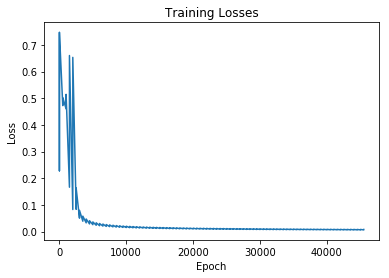

In [86]:
plt.figure(2)
train_losses2 = np.array(train_losses2)
plt.plot(epoch_n2, train_losses2.T)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Losses")
plt.show()

### Cost Function
This part will use different cost function: Cross-entropy.

In [49]:
# Set training epoches and learning rate
epochs3 = 1000
lr_rate = 0.6

In [45]:
class Network3(object):
    
    def __init__(self, sizes):
        """The list "sizes" contains the number of neurons in respective layers.""" 
        self.sizes = sizes
        self.number_layers = len(sizes)
        self.biases = [np.random.randn(i, 1) for i in sizes[1:]]
        self.weights = [np.random.randn(i, j) for i,j in zip(sizes[1:],sizes[:-1])]   
        
    def feedforward(self, input_):
        """Return the output of the neural network."""
        activation = input_
        for bias, weight in zip(self.biases, self.weights):
            output = np.dot(weight, activation) + bias
            activation = sigmoid(output)
        return activation
    
    def set_values(self, weights, biases):
        self.weights = weights
        self.biases = biases
    
    def backprop(self, training_data, desired_output, lr_rate):
        """Update parameters"""
        # Store gradients of weights and biases for update
        grad_weights = np.zeros_like(self.weights)
        grad_biases = np.zeros_like(self.biases)
        
        # Store outputs and activations for backprop
        outputs = []
        activation = training_data
        activations = [activation] 
        for b, w in zip(self.biases, self.weights):
            output = np.dot(w, activation) + b
            outputs.append(output)
            activation = sigmoid(output)
            activations.append(activation)
        
        # Compute the gradients of the last layer
        delta =  self.feedforward(training_data) - desired_output # Modify this line
        grad_biases[-1] = delta
        grad_weights[-1] = np.dot(delta, activations[-2].transpose())
        
        # Compute gradients of remaining layers
        for layer in range(2, self.number_layers):
            delta = np.dot(self.weights[-layer+1].transpose(), delta) * sigmoid_deriv(outputs[-layer])
            grad_biases[-layer] = delta
            grad_weights[-layer] = np.dot(delta, activations[-layer-1].transpose())
        
        # Update weights and biases
        self.weights = [w-lr_rate*grad_w for w, grad_w in zip(self.weights, grad_weights)]
        self.biases = [b-lr_rate*grad_b for b, grad_b in zip(self.biases, grad_biases)]
        

In [88]:
# Train the network 
def train3(training_data, desired_output, epochs3, lr_rate):
    losses = [] # Store losses for plotting
    epoch_n = [] # Store epochs for plotting
    network = Network3([2,2,1])
    for epoch in range(epochs3):
        for x, y in zip(training_data, desired_output):
            x = x[:, None] # Convert row vector to column vector
            network.backprop(x, y, lr_rate)
            # Printing out the training progress
            train_loss = abs(y - network.feedforward(x))
            if epoch % 500 == 0:
                losses.append(train_loss[0][0]) 
                epoch_n.append(epoch)
            print("Epoch: {}, Training Loss: {:.5f}".format(epoch, train_loss[0][0]))
    return network.weights, network.biases, losses, epoch_n
    
weights3, biases3, train_losses3, epoch_n3 = train3(training_data, desired_output, epochs3, lr_rate)

Epoch: 0, Training Loss: 0.28528
Epoch: 0, Training Loss: 0.52031
Epoch: 0, Training Loss: 0.42876
Epoch: 0, Training Loss: 0.40858
Epoch: 1, Training Loss: 0.34081
Epoch: 1, Training Loss: 0.46594
Epoch: 1, Training Loss: 0.39644
Epoch: 1, Training Loss: 0.43559
Epoch: 2, Training Loss: 0.35881
Epoch: 2, Training Loss: 0.44850
Epoch: 2, Training Loss: 0.38769
Epoch: 2, Training Loss: 0.44360
Epoch: 3, Training Loss: 0.36431
Epoch: 3, Training Loss: 0.44191
Epoch: 3, Training Loss: 0.38583
Epoch: 3, Training Loss: 0.44580
Epoch: 4, Training Loss: 0.36597
Epoch: 4, Training Loss: 0.43842
Epoch: 4, Training Loss: 0.38604
Epoch: 4, Training Loss: 0.44623
Epoch: 5, Training Loss: 0.36645
Epoch: 5, Training Loss: 0.43571
Epoch: 5, Training Loss: 0.38690
Epoch: 5, Training Loss: 0.44609
Epoch: 6, Training Loss: 0.36657
Epoch: 6, Training Loss: 0.43309
Epoch: 6, Training Loss: 0.38799
Epoch: 6, Training Loss: 0.44574
Epoch: 7, Training Loss: 0.36656
Epoch: 7, Training Loss: 0.43033
Epoch: 7, 

In [68]:
epoch_n == epoch_plt.legend(loc='best')n2 == epoch_n3

True

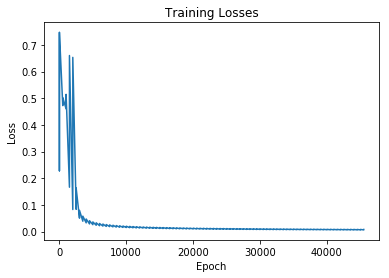

In [89]:
plt.figure(3)
train_losses2 = np.array(train_losses2)
plt.plot(epoch_n2, train_losses2.T)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Losses")
plt.show()

## Combine all the loss results
Now let's analysis all the results of different methods. More detials please see the 'Report - Analysis the neural network'.

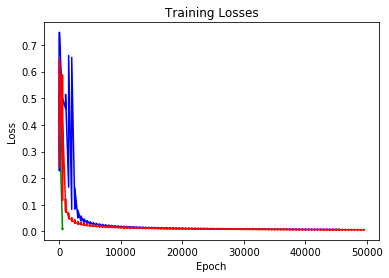

In [91]:
train_losses3 = np.array(train_losses3)
plt.figure(4)
plt.plot(epoch_n3, train_losses3, 'g', label='Cross-entropy')
plt.plot(epoch_n2, train_losses2, 'b', label='Regularized-Gaussian')
plt.plot(epoch_n, train_losses, 'r', label='Normal')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training Losses")
plt.show()

From the figure we can see that with the help of cross-entropy cost function we can get the better result.